In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

%load_ext autoreload
%autoreload 2

## 1. import the scRNA-seq reference

In [2]:
sc_adata = sc.read_h5ad("data/scRefSubsampled1000_hippocampus.h5ad")

In [3]:
sc_adata

AnnData object with n_obs × n_vars = 15095 × 27953
    obs: &#39;liger_ident_coarse&#39;
    var: &#39;rep(0, 27953)&#39;

In [4]:
sc_adata.obs["liger_ident_coarse"].value_counts()

Polydendrocyte           1000
Oligodendrocyte          1000
CA1                      1000
CA3                      1000
Denate                   1000
Endothelial_Stalk        1000
Entorihinal              1000
Interneuron              1000
Microglia_Macrophages    1000
Mural                    1000
Neuron.Slc17a6           1000
Astrocyte                1000
Neurogenesis              988
Ependymal                 715
Endothelial_Tip           676
Cajal_Retzius             672
Choroid                    44
Name: liger_ident_coarse, dtype: int64

## 2. Import (and filter) the spatial dataset

In [5]:
adata = sc.datasets.visium_sge(sample_id="V1_Adult_Mouse_Brain")
adata.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... storing &#39;feature_types&#39; as categorical
... storing &#39;genome&#39; as categorical


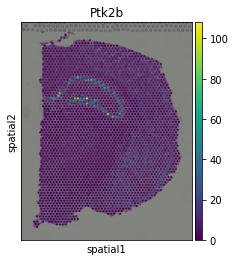

In [6]:
sc.pl.spatial(adata, img_key="hires", color=["Ptk2b"])

In [7]:
st_adata = adata[adata.obs["array_row"] > 15]
st_adata = st_adata[st_adata.obs["array_row"] < 32]
st_adata = st_adata[st_adata.obs["array_col"] > 20]
st_adata = st_adata[st_adata.obs["array_col"] < 80]

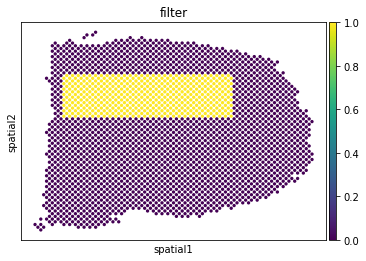

In [8]:
adata.obs["filter"] = [x in st_adata.obs.index for x in adata.obs.index]
sc.pl.embedding(adata, basis="spatial", color="filter")

Marker genes
+ CA1: Fibcd1
+ CA3: Npy2r
+ Dentate: Prox1
+ Oligo: Plp1
+ Astrocytes: Aldoc

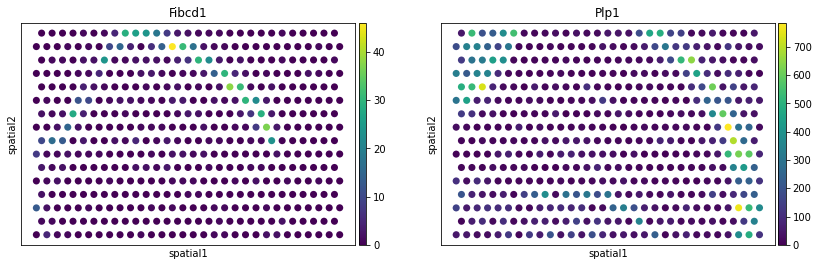

In [9]:
sc.pl.embedding(st_adata, basis="spatial", color=["Fibcd1", "Plp1"], size=200)

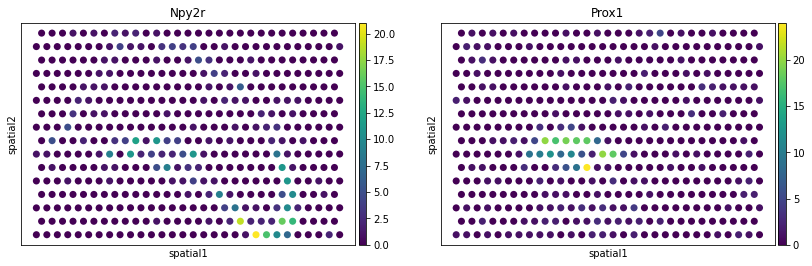

In [10]:
sc.pl.embedding(st_adata, basis="spatial", color=["Npy2r", "Prox1"], size=200)

## 3. Learn cell type specific gene expression based on the single-cell data

In [11]:
# let us filter some genes
sc.pp.filter_genes(sc_adata, min_counts=10)

In [12]:
sc_adata.layers["counts"] = sc_adata.X.copy()

In [13]:
sc.pp.normalize_total(sc_adata, target_sum=10e4)
sc.pp.log1p(sc_adata)
sc_adata.raw = sc_adata

In [14]:
sc.pp.highly_variable_genes(
    sc_adata,
    n_top_genes=2000,
    subset=True,
    layer="counts",
    flavor="seurat_v3"
)

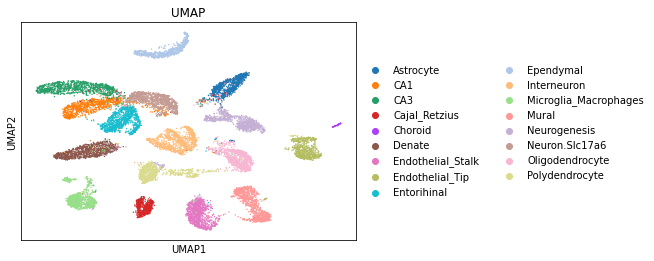

In [15]:
sc.tl.pca(sc_adata, svd_solver='arpack')
sc.pp.neighbors(sc_adata, n_pcs = 30, n_neighbors = 20)
sc.tl.umap(sc_adata)
sc.pl.umap(sc_adata, color='liger_ident_coarse',  title="UMAP")

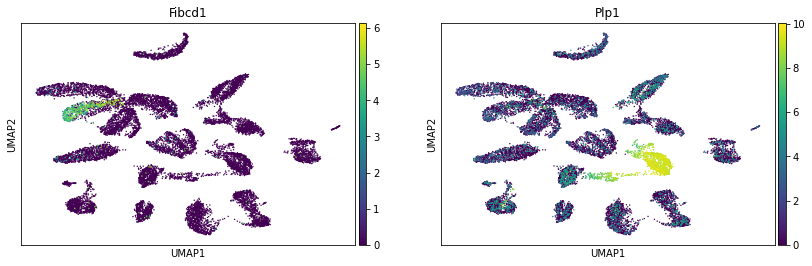

In [16]:
sc.pl.umap(sc_adata, color=['Fibcd1', "Plp1"])

In [17]:
import scvi
from scvi.model.stereoscope import scStereoscope, stStereoscope
from scvi.data import register_tensor_from_anndata

In [18]:
scvi.data.setup_anndata(sc_adata, layer="counts", labels_key="liger_ident_coarse")

INFO      No batch_key inputted, assuming all cells are same batch                           
INFO      Using labels from adata.obs[&quot;liger_ident_coarse&quot;]                                  
INFO      Using data from adata.layers[&quot;counts&quot;]                                             
INFO      Computing library size prior per batch                                             
INFO      Successfully registered anndata object containing 15095 cells, 2000 genes, 1       
          batches, 17 labels, and 0 proteins. Also registered 0 extra categorical covariates 
          and 0 extra continuous covariates.                                                 
INFO      Please do not further modify adata until model is trained.                         


In [19]:
sc_adata.obs["indices"] = np.arange(sc_adata.n_obs)
register_tensor_from_anndata(sc_adata, "ind_x", "obs", "indices")

In [20]:
model = scStereoscope(sc_adata)
model.train(lr=0.01, n_epochs=100, frequency=5)

INFO      Training for 100 epochs                                                            
INFO      KL warmup phase exceeds overall training phaseIf your applications rely on the     
          posterior quality, consider training for more epochs or reducing the kl warmup.    
INFO      KL warmup for 400 epochs                                                           


Output()

INFO      Training is still in warming up phase. If your applications rely on the posterior  
          quality, consider training for more epochs or reducing the kl warmup.              
INFO      Training time:  101 s. / 100 epochs                                                


&lt;matplotlib.legend.Legend at 0x7efe102a8cf8&gt;

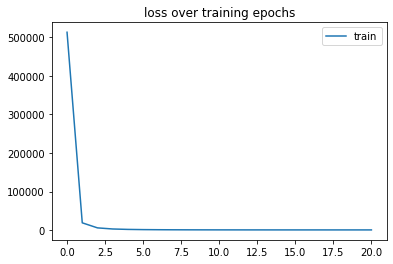

In [21]:
plt.plot(model.history["elbo_train_set"], label="train")
plt.title("loss over training epochs")
plt.legend()

In [22]:
params = model.get_params()
params[0].shape

(2000, 17)

In [23]:
model.save("scmodel.pkl", overwrite=True)

In [24]:
index = np.where(sc_adata.uns["_scvi"]["categorical_mappings"]["_scvi_labels"]["mapping"] == "Astrocyte")[0][0]

(array([ 10.,  37., 322., 858., 433., 139.,  77.,  52.,  44.,  28.]),
 array([-8.414302  , -7.56416   , -6.714018  , -5.863876  , -5.013734  ,
        -4.163592  , -3.3134499 , -2.4633079 , -1.613166  , -0.763024  ,
         0.08711802], dtype=float32),
 &lt;BarContainer object of 10 artists&gt;)

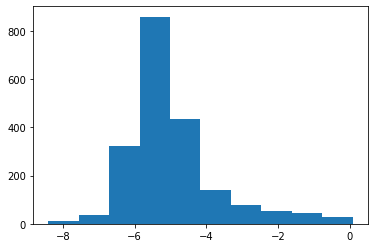

In [25]:
plt.hist(params[0][:, index])

In [26]:
sc_adata.var_names[np.where(params[0][:, 1] > -5)[0]]

Index([&#39;1110004E09Rik&#39;, &#39;1110008P14Rik&#39;, &#39;1110032A03Rik&#39;, &#39;1700001L19Rik&#39;,
       &#39;1700007K13Rik&#39;, &#39;1700013F07Rik&#39;, &#39;1700024P16Rik&#39;, &#39;1700028P14Rik&#39;,
       &#39;1700084C01Rik&#39;, &#39;1700088E04Rik&#39;,
       ...
       &#39;Ywhag&#39;, &#39;Ywhah&#39;, &#39;Zak&#39;, &#39;Zbtb18&#39;, &#39;Zcchc12&#39;, &#39;Zdbf2&#39;, &#39;Zfp36&#39;,
       &#39;Zfp385b&#39;, &#39;Zfp804a&#39;, &#39;Zmynd10&#39;],
      dtype=&#39;object&#39;, length=1040)

In [27]:
list(zip(sc_adata.uns["_scvi"]["categorical_mappings"]["_scvi_labels"]["mapping"], params[0][np.where(sc_adata.var_names == "Fibcd1")[0][0],]))

[(&#39;Astrocyte&#39;, -5.097702),
 (&#39;CA1&#39;, -0.2728986),
 (&#39;CA3&#39;, -4.6420264),
 (&#39;Cajal_Retzius&#39;, -3.484648),
 (&#39;Choroid&#39;, -4.5490108),
 (&#39;Denate&#39;, -3.6648293),
 (&#39;Endothelial_Stalk&#39;, -5.386399),
 (&#39;Endothelial_Tip&#39;, -4.555802),
 (&#39;Entorihinal&#39;, -4.920606),
 (&#39;Ependymal&#39;, -5.3944445),
 (&#39;Interneuron&#39;, -4.5066576),
 (&#39;Microglia_Macrophages&#39;, -4.407077),
 (&#39;Mural&#39;, -4.9822507),
 (&#39;Neurogenesis&#39;, -4.8911405),
 (&#39;Neuron.Slc17a6&#39;, -4.4070973),
 (&#39;Oligodendrocyte&#39;, -5.490296),
 (&#39;Polydendrocyte&#39;, -3.9396448)]

1456

## 4. Infer proportions for the spatial data 

In [28]:
# filter genes to be the same on the spatial data
intersect = np.intersect1d(sc_adata.var_names, st_adata.var_names)
st_adata = st_adata[:, intersect].copy()

# remove missing genes in scRNA-seq parameters
mask = [x in intersect for x in sc_adata.var_names]
params = [params[0][mask, :], params[1][mask]]

In [29]:
st_adata.layers["counts"] = st_adata.X.copy()
scvi.data.setup_anndata(st_adata, layer="counts")

INFO      No batch_key inputted, assuming all cells are same batch                           
INFO      No label_key inputted, assuming all cells have same label                          
INFO      Using data from adata.layers[&quot;counts&quot;]                                             
INFO      Computing library size prior per batch                                             
INFO      Successfully registered anndata object containing 472 cells, 1913 genes, 1 batches,
          1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0     
          extra continuous covariates.                                                       
INFO      Please do not further modify adata until model is trained.                         


In [30]:
st_adata.obs["indices"] = np.arange(st_adata.n_obs)
register_tensor_from_anndata(st_adata, "ind_x", "obs", "indices")

In [31]:
spatial_model = stStereoscope(st_adata, params)
spatial_model.train(lr=0.01, n_epochs=3000, train_size=1, frequency=5)

INFO      Training for 3000 epochs                                                           
INFO      KL warmup for 400 epochs                                                           


Output()

INFO      Training time:  69 s. / 3000 epochs                                                


&lt;matplotlib.legend.Legend at 0x7efe281f54e0&gt;

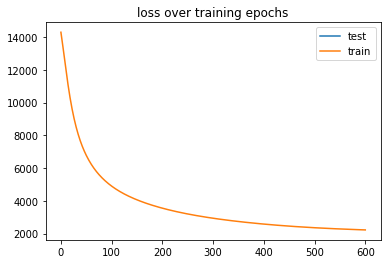

In [32]:
plt.plot(spatial_model.history["elbo_test_set"], label="test")
plt.plot(spatial_model.history["elbo_train_set"], label="train")
plt.title("loss over training epochs")
plt.legend()

In [33]:
import pandas as pd
st_adata.obsm["deconvolution"] = pd.DataFrame(data=spatial_model.get_proportions(), index=st_adata.obs.index, columns=sc_adata.uns["_scvi"]["categorical_mappings"]["_scvi_labels"]["mapping"])

In [34]:
st_adata.obsm["deconvolution"].columns

Index([&#39;Astrocyte&#39;, &#39;CA1&#39;, &#39;CA3&#39;, &#39;Cajal_Retzius&#39;, &#39;Choroid&#39;, &#39;Denate&#39;,
       &#39;Endothelial_Stalk&#39;, &#39;Endothelial_Tip&#39;, &#39;Entorihinal&#39;, &#39;Ependymal&#39;,
       &#39;Interneuron&#39;, &#39;Microglia_Macrophages&#39;, &#39;Mural&#39;, &#39;Neurogenesis&#39;,
       &#39;Neuron.Slc17a6&#39;, &#39;Oligodendrocyte&#39;, &#39;Polydendrocyte&#39;],
      dtype=&#39;object&#39;)

In [35]:
for ct in st_adata.obsm["deconvolution"].columns:
    st_adata.obs[ct] = st_adata.obsm["deconvolution"][ct]

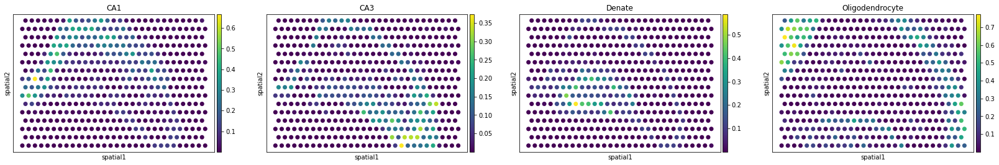

In [36]:
sc.pl.embedding(st_adata, basis="spatial", color=["CA1", "CA3", "Denate", "Oligodendrocyte"], size=200)

(array([1.891e+03, 1.800e+01, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 2.000e+00]),
 array([ -4.0191975,   6.7819614,  17.58312  ,  28.38428  ,  39.18544  ,
         49.9866   ,  60.787758 ,  71.58891  ,  82.390076 ,  93.19123  ,
        103.99239  ], dtype=float32),
 &lt;BarContainer object of 10 artists&gt;)

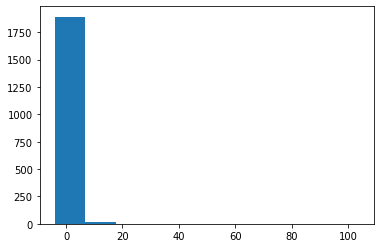

In [37]:
plt.hist(spatial_model.model.eta.detach().cpu().numpy())